# Outlier_Graph

## 필요 라이브러리 로드

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os, math

In [3]:
import platform
from matplotlib import font_manager, rc

# 한글 폰트 지정
path = "C:/Windows/Fonts/malgun.ttf"
if platform.system() == "Windows":
    font_name = font_manager.FontProperties(fname=path).get_name()
    rc('font', family=font_name)
elif platform.system()=="Darwin":
    rc('font', family='AppleGothic')
else:
    print("Unknown System")

In [4]:
import matplotlib
matplotlib.rcParams['axes.unicode_minus'] = False # 그래프에서 음수 표현 가능하도록 설정.

In [30]:
import seaborn as sns

## 파일 불러오기

In [5]:
site_name = 'vibe'

In [6]:
# 기간 설정
start_date = '2022-05-02'
end_date = '2022-05-08'

In [7]:
code_path = 'c:/data/Wantreez/Crawling/music'
code_path

'c:/data/Wantreez/Crawling/music'

In [8]:
# 실시간 순위 파일 폴더로 이동
live_folder = f'/crawled_data/mod_{site_name}/'
try:
    os.chdir(code_path + live_folder)
except:
    pass

In [9]:
file_list = os.listdir()
for i, s in enumerate(file_list):
    print(i, s)

0 live_vibe_20220405.xlsx
1 live_vibe_20220406.xlsx
2 live_vibe_20220407.xlsx
3 live_vibe_20220412.xlsx
4 live_vibe_20220413.xlsx
5 live_vibe_20220413_154819.xlsx
6 live_vibe_20220414_134945.xlsx
7 live_vibe_20220415_180611.xlsx
8 live_vibe_20220418_111004.xlsx
9 live_vibe_20220419_110642.xlsx
10 live_vibe_20220420_110627.xlsx
11 live_vibe_20220421_110704.xlsx
12 live_vibe_20220422_110647.xlsx
13 live_vibe_20220425_110704.xlsx
14 live_vibe_20220426_110637.xlsx
15 live_vibe_20220427_110635.xlsx
16 live_vibe_20220428_110605.xlsx
17 live_vibe_20220429_110625.xlsx
18 live_vibe_20220430_110605.xlsx
19 live_vibe_20220501_110605.xlsx
20 live_vibe_20220502_110605.xlsx
21 live_vibe_20220503_110605.xlsx
22 live_vibe_20220504_110605.xlsx
23 live_vibe_20220505_110605.xlsx
24 live_vibe_20220506_110605.xlsx
25 live_vibe_20220507_110630.xlsx
26 live_vibe_20220508_110605.xlsx
27 live_vibe_20220509_110605.xlsx
28 live_vibe_20220510_110604.xlsx


## 수집한 파일 모두 합치기

In [10]:
df = pd.DataFrame()
for one in file_list:
    temp = pd.read_excel(one)
    df = pd.concat([df, temp], ignore_index=True)
df.head()

,사이트,날짜,순위,곡,가수,앨범,소속사,소속사_분류
0,vibe,2022-04-05 00:00:00,1,TOMBOY,(여자) 아이들,I NEVER DIE,CUBE,기타
1,vibe,2022-04-05 00:00:00,2,Feel My Rhythm,Red Velvet (레드벨벳),'The ReVe Festival 2022 - Feel My Rhythm',SM,SM
2,vibe,2022-04-05 00:00:00,3,GANADARA (Feat. 아이유),박재범,GANADARA,MORE VISION,기타
3,vibe,2022-04-05 00:00:00,4,INVU,태연 (TAEYEON),INVU - The 3rd Album,SM,SM
4,vibe,2022-04-05 00:00:00,5,RUN2U,STAYC(스테이씨),YOUNG-LUV.COM,HIGH UP,기타


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2929 entries, 0 to 2928
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   사이트     2929 non-null   object
 1   날짜      2929 non-null   object
 2   순위      2929 non-null   int64 
 3   곡       2929 non-null   object
 4   가수      2929 non-null   object
 5   앨범      2929 non-null   object
 6   소속사     2908 non-null   object
 7   소속사_분류  2908 non-null   object
dtypes: int64(1), object(7)
memory usage: 183.2+ KB


In [11]:
df['날짜'] = df['날짜'].astype(str)

In [12]:
sliced_df = df[(df['날짜'] >= start_date) & (df['날짜'] <= end_date)].reset_index(drop=True)
sliced_df.head()

,사이트,날짜,순위,곡,가수,앨범,소속사,소속사_분류
0,vibe,2022-05-02,1,LOVE DIVE,IVE(아이브),LOVE DIVE,스타쉽,스타쉽
1,vibe,2022-05-02,2,봄여름가을겨울 (Still Life),BIGBANG (빅뱅),봄여름가을겨울 (Still Life),YG,YG
2,vibe,2022-05-02,3,TOMBOY,(여자) 아이들,I NEVER DIE,CUBE,기타
3,vibe,2022-05-02,4,Feel My Rhythm,Red Velvet (레드벨벳),'The ReVe Festival 2022 - Feel My Rhythm',SM,SM
4,vibe,2022-05-02,5,사랑인가 봐,멜로망스(Melomance),사랑인가 봐 (사내맞선 OST 스페셜 트랙),ABYSS,기타


In [13]:
sliced_df.tail()

,사이트,날짜,순위,곡,가수,앨범,소속사,소속사_분류
702,vibe,2022-05-08,97,BOP BOP!,VIVIZ(비비지),The 1st Mini Album 'Beam Of Prism',빅플래닛메이드,기타
703,vibe,2022-05-08,97,BOP BOP!,VIVIZ(비비지),The 1st Mini Album 'Beam Of Prism',스윙,스윙
704,vibe,2022-05-08,98,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타
705,vibe,2022-05-08,99,Queendom,Red Velvet (레드벨벳),Queendom - The 6th Mini Album,SM,SM
706,vibe,2022-05-08,100,With you,지민,우리들의 블루스 OST Part 4,빅히트,빅히트


In [14]:
sliced_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 707 entries, 0 to 706
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   사이트     707 non-null    object
 1   날짜      707 non-null    object
 2   순위      707 non-null    int64 
 3   곡       707 non-null    object
 4   가수      707 non-null    object
 5   앨범      707 non-null    object
 6   소속사     707 non-null    object
 7   소속사_분류  707 non-null    object
dtypes: int64(1), object(7)
memory usage: 44.3+ KB


In [16]:
sliced_df[sliced_df['소속사'].isna() == True]

,사이트,날짜,순위,곡,가수,앨범,소속사,소속사_분류


### 수집한 곡의 유니크

In [17]:
len(sliced_df['곡'].unique())

106

In [18]:
dates = pd.date_range(start_date, end_date)
basic_date_df = pd.DataFrame({'날짜':dates})
basic_date_df['날짜'] = basic_date_df['날짜'].astype('str')
basic_date_df

,날짜
0,2022-05-02
1,2022-05-03
2,2022-05-04
3,2022-05-05
4,2022-05-06
5,2022-05-07
6,2022-05-08


### 제목과 가수 매칭 값 추출

In [20]:
unique_sliced_df = sliced_df.drop_duplicates(['곡', '가수']).reset_index(drop=True)
unique_sliced_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106 entries, 0 to 105
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   사이트     106 non-null    object
 1   날짜      106 non-null    object
 2   순위      106 non-null    int64 
 3   곡       106 non-null    object
 4   가수      106 non-null    object
 5   앨범      106 non-null    object
 6   소속사     106 non-null    object
 7   소속사_분류  106 non-null    object
dtypes: int64(1), object(7)
memory usage: 6.8+ KB


### 순위변동 열 추가한 df 생성
* 기본 날짜에 데이터 추가
* nan값 중 곡, 가수, 앨범 명은 해당 가수의 정보로 채우기

In [23]:
song_df_list = []
for i in range(unique_sliced_df.shape[0]):
    temp = unique_sliced_df.iloc[i:i+1, :].reset_index(drop=True)
    one_df = sliced_df[(sliced_df['곡'] == temp['곡'][0]) & (sliced_df['가수'] == temp['가수'][0])].reset_index(drop=True)
    one_df['순위변동'] = - ( one_df['순위'] - one_df['순위'].shift(1) )
    one_df['순위변동'] = one_df['순위변동'].fillna(0)
    one_df['순위변동'] = one_df['순위변동'].astype('int64')
    merged_df = pd.merge(basic_date_df, one_df, how='left', on='날짜')
    site = merged_df['사이트'].value_counts().index[0]
    title = merged_df['곡'].value_counts().index[0]
    artist = merged_df['가수'].value_counts().index[0]
    album = merged_df['앨범'].value_counts().index[0]
    agency = merged_df['소속사'].value_counts().index[0]
    agency_type = merged_df['소속사_분류'].value_counts().index[0]
    merged_df['사이트'] = merged_df['사이트'].fillna(site)
    merged_df['곡'] = merged_df['곡'].fillna(title)
    merged_df['가수'] = merged_df['가수'].fillna(artist)
    merged_df['앨범'] = merged_df['앨범'].fillna(album)
    merged_df['소속사'] = merged_df['소속사'].fillna(agency)
    merged_df['소속사_분류'] = merged_df['소속사_분류'].fillna(agency_type)
    song_df_list.append(merged_df)

In [24]:
merged_df

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동
0,2022-05-02,vibe,NaN,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타,NaN
1,2022-05-03,vibe,NaN,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타,NaN
2,2022-05-04,vibe,NaN,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타,NaN
3,2022-05-05,vibe,NaN,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타,NaN
4,2022-05-06,vibe,NaN,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타,NaN
5,2022-05-07,vibe,NaN,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타,NaN
6,2022-05-08,vibe,98.0,사랑을 사랑하게 될 때까지,잔나비 최정훈,사랑을 사랑하게 될 때까지,페포니 뮤직,기타,0.0


### 노래 개수

In [25]:
len(song_df_list)

106

## 그래프 테스트

### 노래 선택

In [26]:
song_df_list[16].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7 entries, 0 to 6
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   날짜      7 non-null      object
 1   사이트     7 non-null      object
 2   순위      7 non-null      int64 
 3   곡       7 non-null      object
 4   가수      7 non-null      object
 5   앨범      7 non-null      object
 6   소속사     7 non-null      object
 7   소속사_분류  7 non-null      object
 8   순위변동    7 non-null      int64 
dtypes: int64(2), object(7)
memory usage: 560.0+ bytes


In [25]:
tmp = song_df_list[100]
tmp

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동
0,2022-05-02,vibe,NaN,FEARLESS,LE SSERAFIM (르세라핌),FEARLESS,SOURCE MUSIC,기타,NaN
1,2022-05-03,vibe,NaN,FEARLESS,LE SSERAFIM (르세라핌),FEARLESS,SOURCE MUSIC,기타,NaN
2,2022-05-04,vibe,60.0,FEARLESS,LE SSERAFIM (르세라핌),FEARLESS,SOURCE MUSIC,기타,0.0
3,2022-05-05,vibe,46.0,FEARLESS,LE SSERAFIM (르세라핌),FEARLESS,SOURCE MUSIC,기타,14.0
4,2022-05-06,vibe,42.0,FEARLESS,LE SSERAFIM (르세라핌),FEARLESS,SOURCE MUSIC,기타,4.0
5,2022-05-07,vibe,38.0,FEARLESS,LE SSERAFIM (르세라핌),FEARLESS,SOURCE MUSIC,기타,4.0
6,2022-05-08,vibe,36.0,FEARLESS,LE SSERAFIM (르세라핌),FEARLESS,SOURCE MUSIC,기타,2.0


In [26]:
tmp['곡'].value_counts().index.values[0]

'FEARLESS'

In [27]:
tmp['가수'].value_counts().index.values[0]

'LE SSERAFIM (르세라핌)'

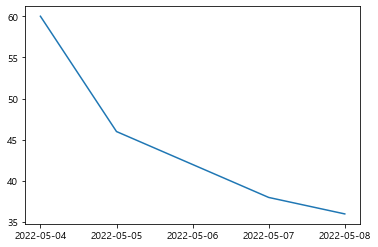

In [28]:
plt.plot(tmp['날짜'], tmp['순위'])

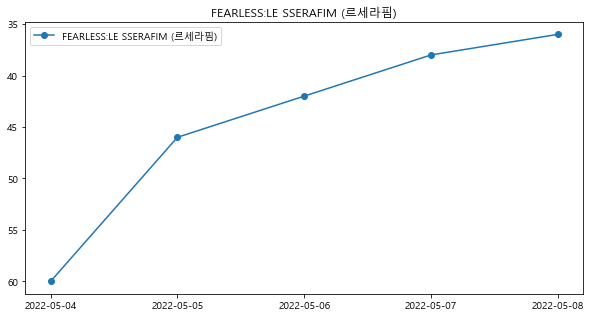

In [29]:
title = tmp['곡'].value_counts().index.values[0]
artist = tmp['가수'].value_counts().index.values[0]
song_label = title + ':' + artist

plt.figure(figsize=(10,5))
ax = plt.axes()
ax.invert_yaxis()
plt.plot(tmp['날짜'], tmp['순위'], '-o', label=song_label)
plt.title(song_label)
plt.legend()
plt.show()

In [30]:
temp_df = song_df_list[70:91]

### 그래프

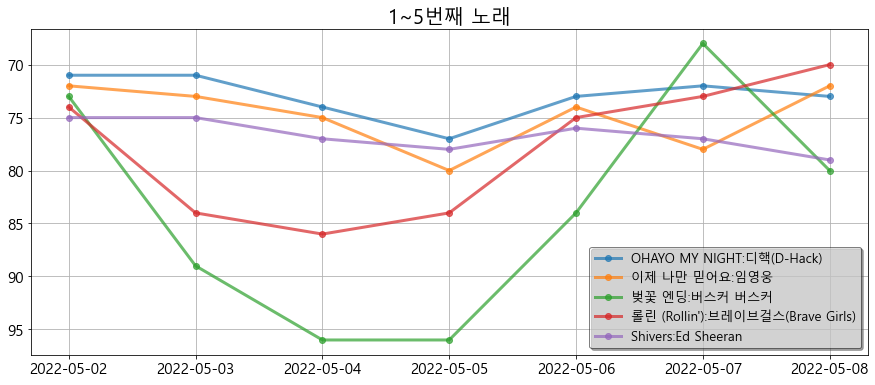

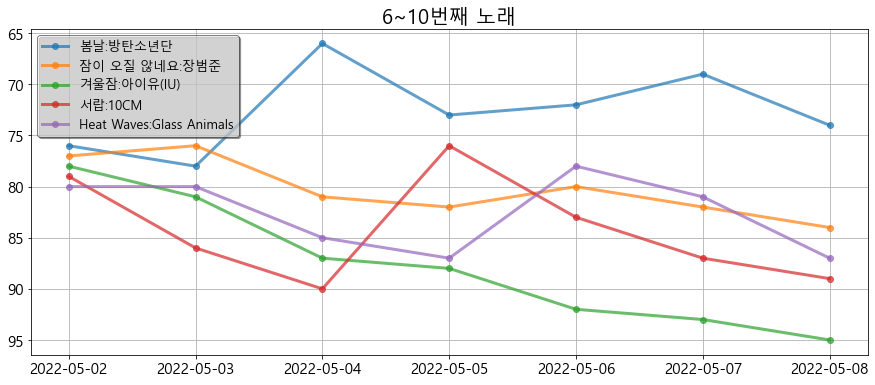

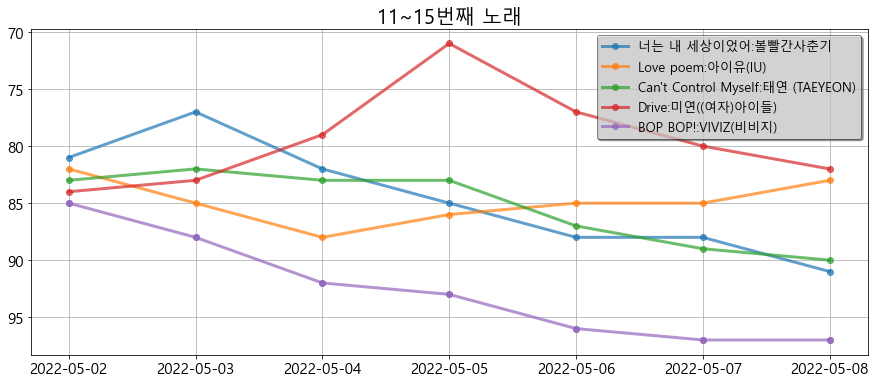

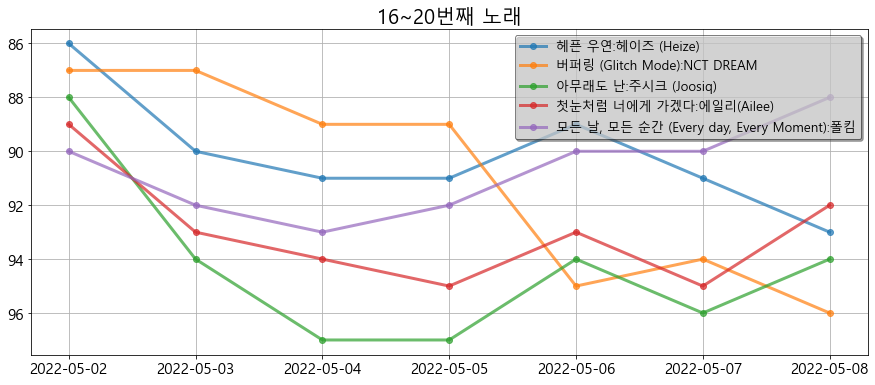

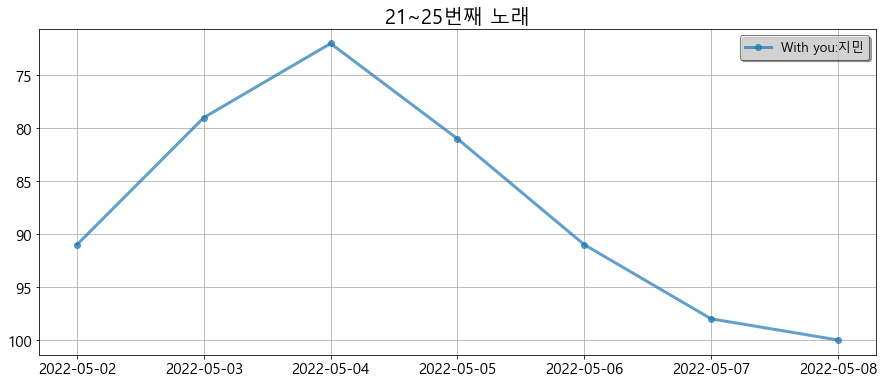

In [31]:
number = 5
t = 0
for i in range( math.ceil(len(temp_df)/number) ):
    plt.figure( figsize=(15, 6) )
    ax = plt.axes()
    ax.invert_yaxis()
    graph_df = temp_df[i*number:(i+1)*number]
    for one in graph_df:
        title = one['곡'].value_counts().index.values[0]
        artist = one['가수'].value_counts().index.values[0]
        song_label = title + ':' + artist
        plt.plot(one['날짜'], one['순위'], '-o', label=song_label, alpha=0.7, linewidth=3)
    t =  t + number
    plt.grid(True)
    plt.title(f'{t-(number-1)}~{t}번째 노래', fontdict={'size':20})
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.legend(framealpha=0.5, frameon=True, shadow=True, edgecolor='k', fontsize=13)
    plt.show()

## 몇 개씩 묶어서 노래 시각화

### 순위 그래프

In [32]:
code_path

'c:/data/Wantreez/Crawling/music'

In [33]:
save_folder = f'/crawled_data/outlier_data/{start_date}_{end_date}/{site_name}/'
save_folder

'/crawled_data/outlier_data/2022-05-02_2022-05-08/vibe/'

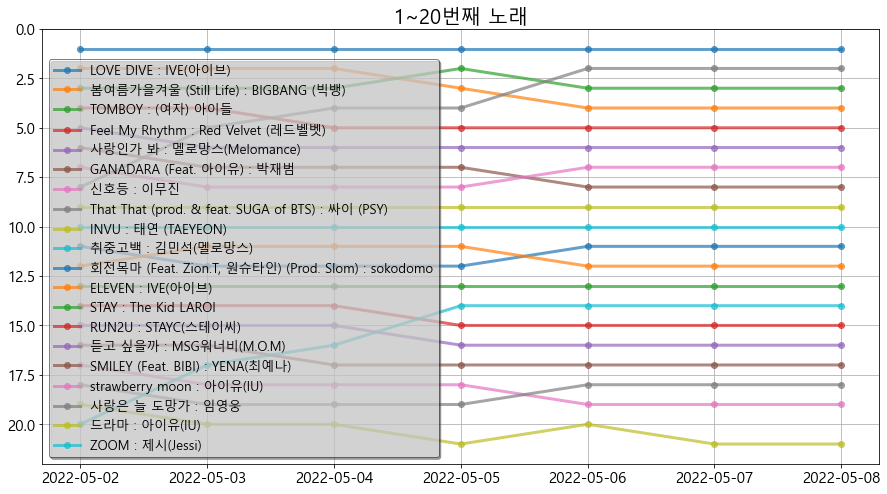

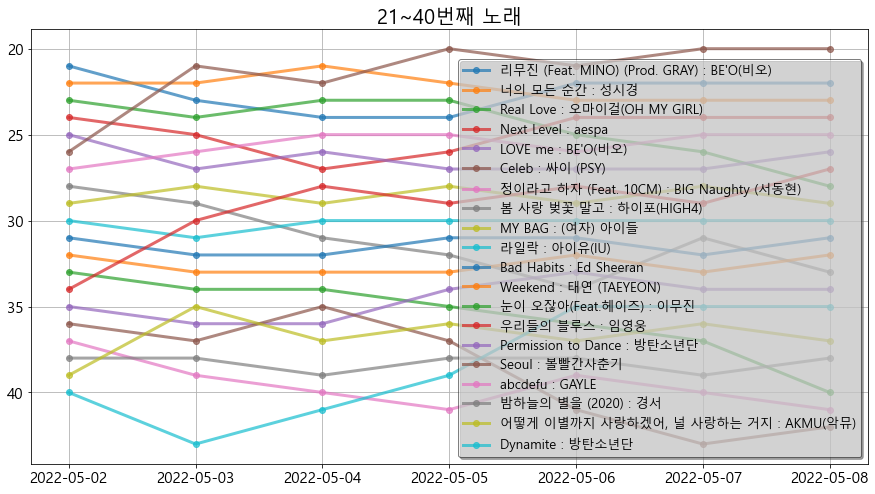

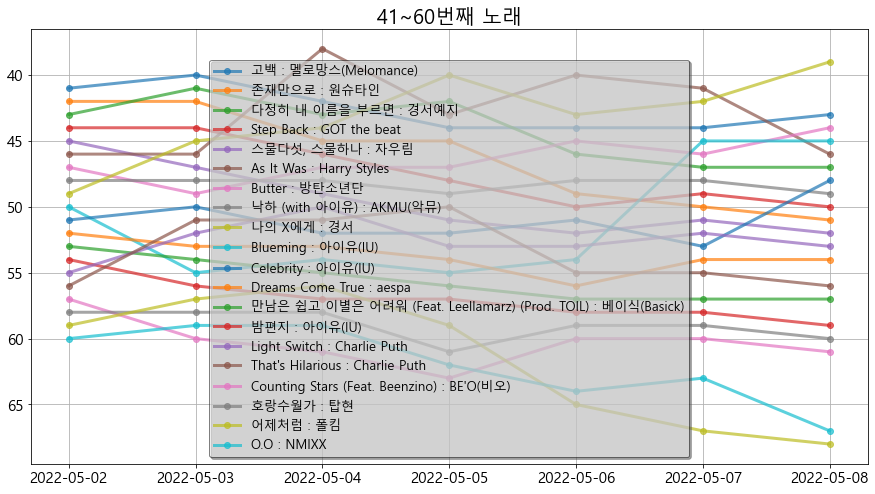

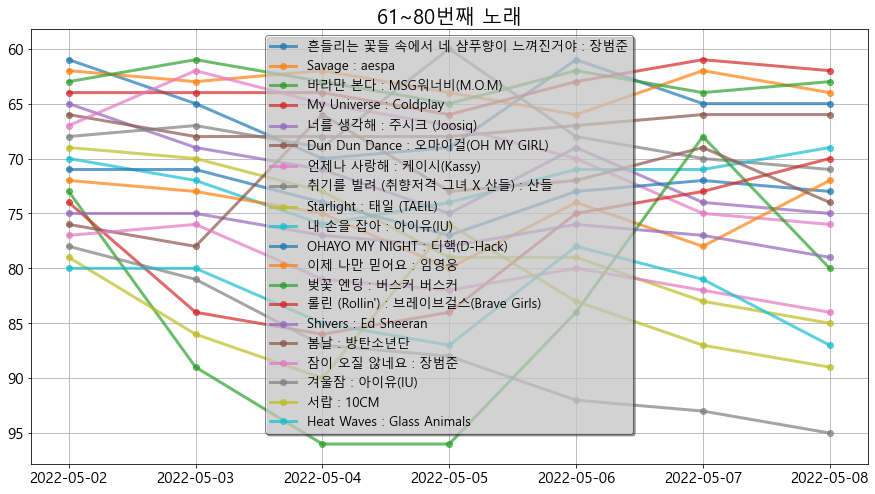

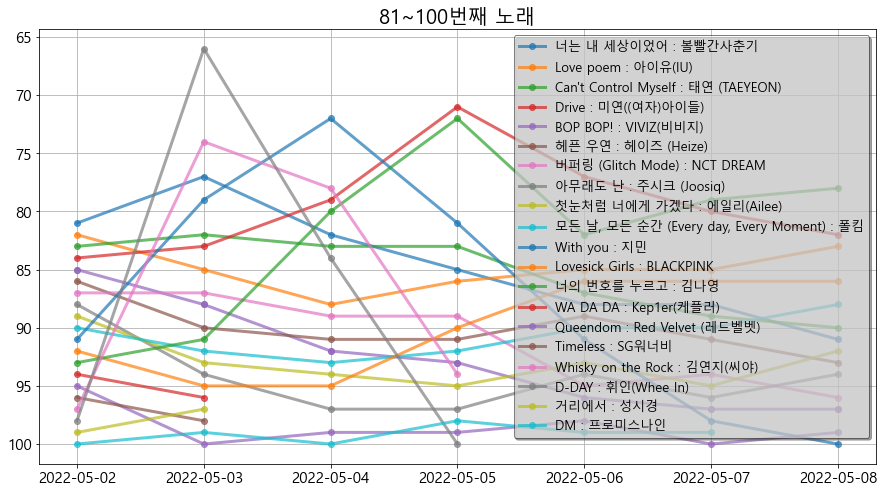

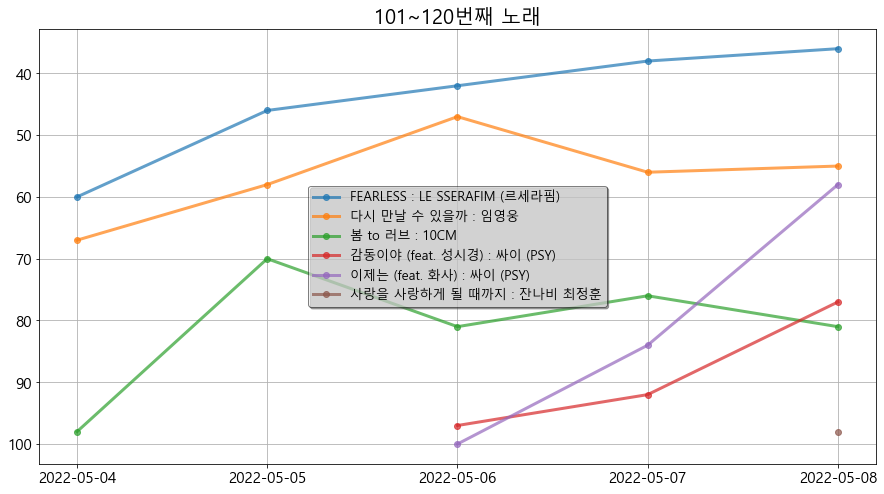

In [34]:
number = 20
t = 0
for i in range( math.ceil(len(song_df_list)/number) ):
    plt.figure( figsize=(15, 8) )
    ax = plt.axes()
    ax.invert_yaxis()
    graph_df = song_df_list[i*number:(i+1)*number]
    for one in graph_df:
        title = one['곡'].value_counts().index.values[0]
        artist = one['가수'].value_counts().index.values[0]
        song_label = title + ' : ' + artist
        plt.plot(one['날짜'], one['순위'], '-o', label=song_label, linewidth=3, alpha=0.7)
    t =  t + number
    plt.grid(True)
    plt.title(f'{t-(number-1)}~{t}번째 노래', fontdict={'size':20})
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.legend(framealpha=0.5, fontsize=13, frameon=True, edgecolor='k', shadow=True);
    plt.savefig(code_path + save_folder + f'{start_date}_{end_date}_그래프{t:0>2}.png')

### 순위 변동 그래프

In [35]:
def change_rank_graph(df, number):
    t = 0
    for i in range( math.ceil(len(df)/number) ):
        plt.figure( figsize=(15, 6) )
        graph_df = df[i*number:(i+1)*number]
        for one in graph_df:
            title = one['곡'].value_counts().index.values[0]
            artist = one['가수'].value_counts().index.values[0]
            song_label = title + ' - ' + artist
            plt.plot(one['날짜'], one['순위변동'], '-o', label=song_label, alpha=0.7, linewidth=3)
        t =  t + number
        plt.grid(True)
        plt.title(f'{t-(number-1)}~{t}번째 노래', fontdict={'size':20})
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        plt.legend(framealpha=0.5, fontsize=13, frameon=True, edgecolor='k', shadow=True)
        plt.show()

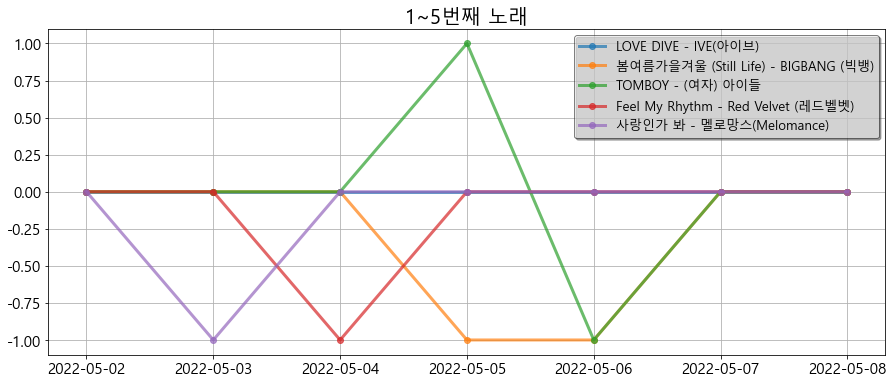

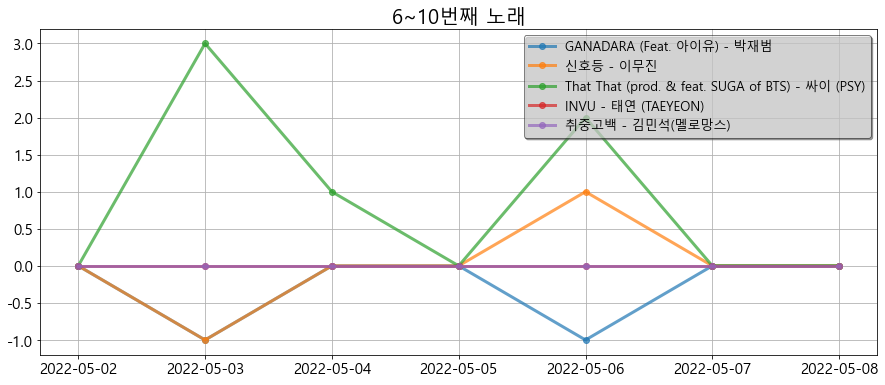

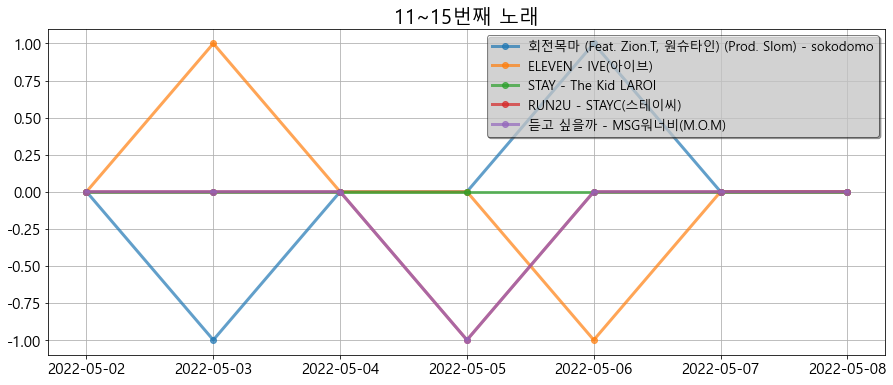

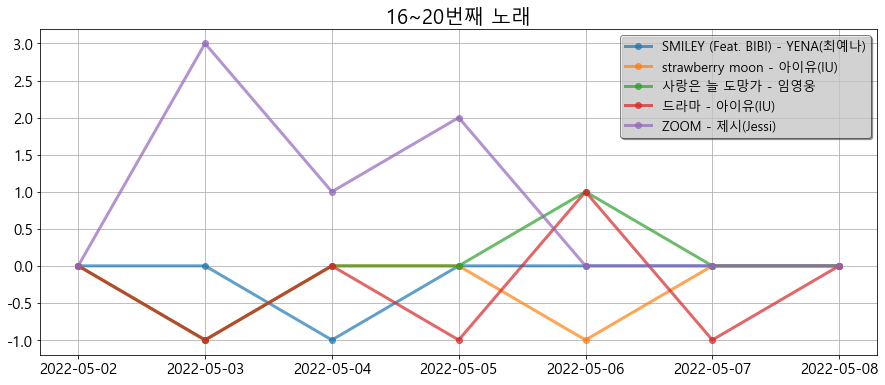

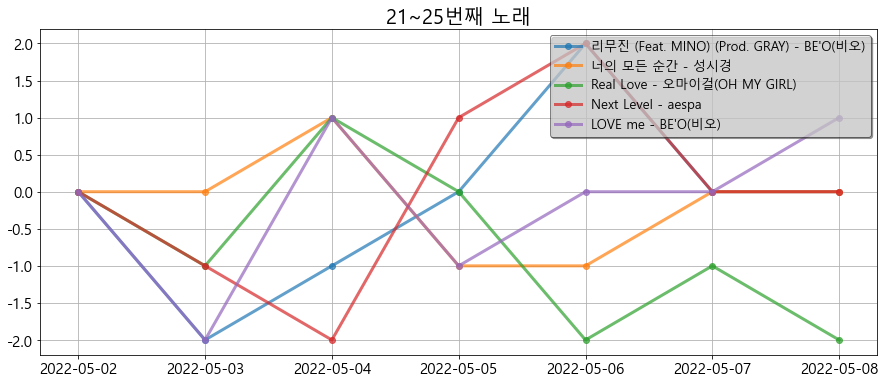

...

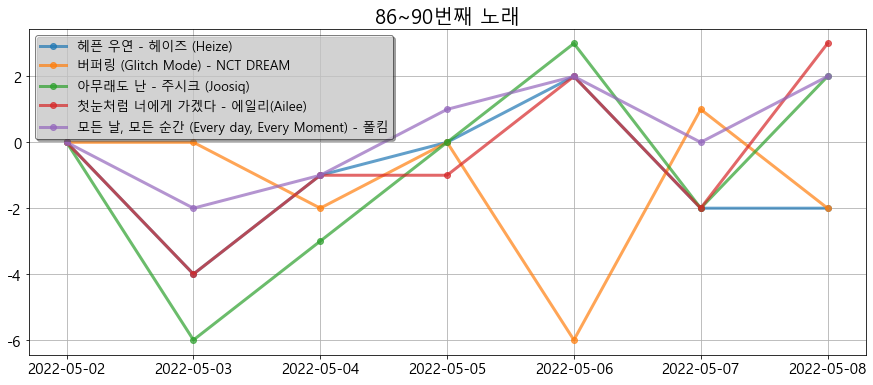

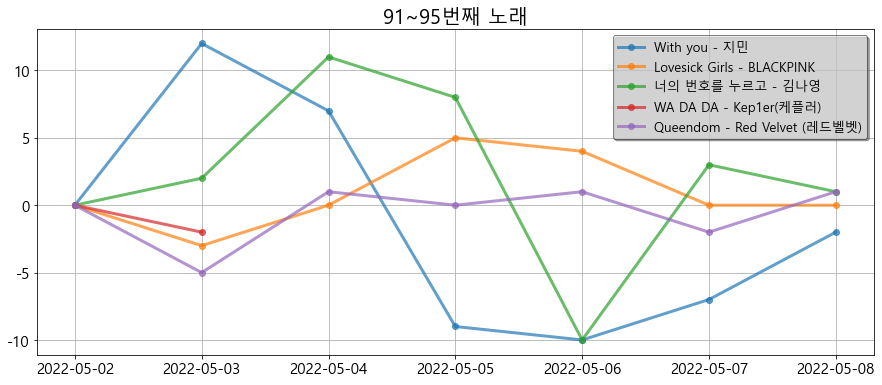

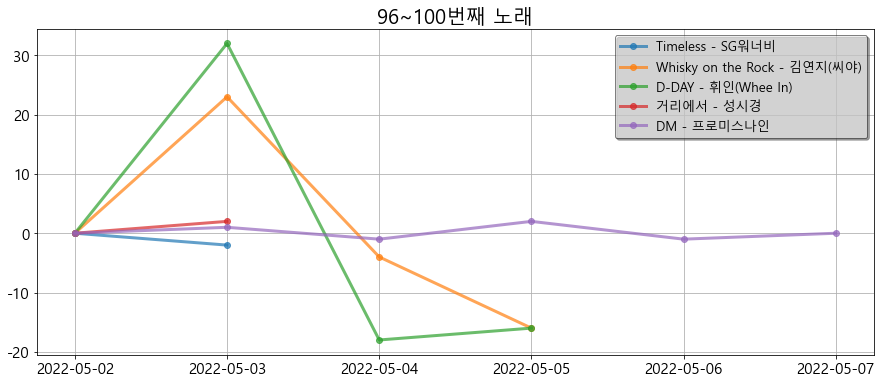

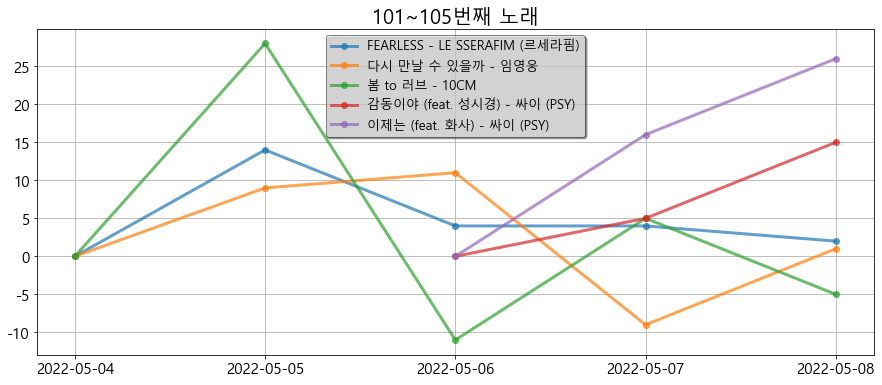

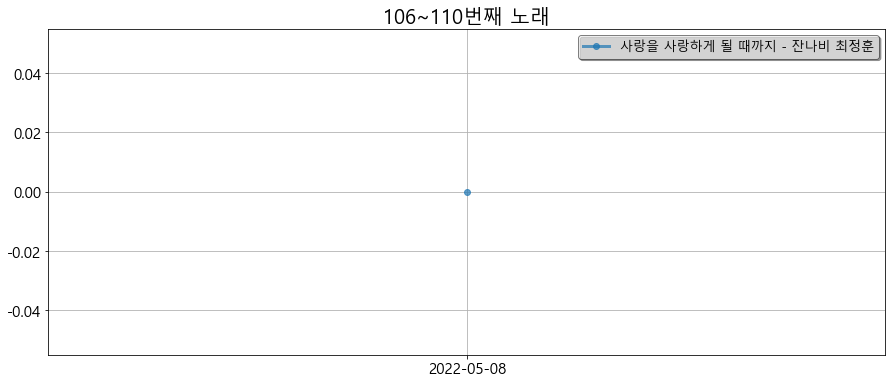

In [36]:
# 노래별 df, 노래 몇개씩 그래프에 나타날지 설정.
change_rank_graph(song_df_list, 5)

## 급등 음원 추출

### 모든 곡 데이터 병합

In [37]:
total_df = pd.DataFrame()
for one in song_df_list:
    total_df = pd.concat([total_df, one], ignore_index=True)

In [38]:
total_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 749 entries, 0 to 748
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   날짜      749 non-null    object 
 1   사이트     749 non-null    object 
 2   순위      707 non-null    float64
 3   곡       749 non-null    object 
 4   가수      749 non-null    object 
 5   앨범      749 non-null    object 
 6   소속사     749 non-null    object 
 7   소속사_분류  749 non-null    object 
 8   순위변동    707 non-null    float64
dtypes: float64(2), object(7)
memory usage: 52.8+ KB


### 유일한 곡, 가수 만 남기기

In [64]:
total_df.sort_values(['사이트', '곡', '가수', '순위']).reset_index(drop=True).iloc[80:85, :]

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동
80,2022-05-07,vibe,99.0,DM,프로미스나인,Midnight Guest,플레디스,플레디스,0.0
81,2022-05-02,vibe,100.0,DM,프로미스나인,Midnight Guest,플레디스,플레디스,0.0
82,2022-05-04,vibe,100.0,DM,프로미스나인,Midnight Guest,플레디스,플레디스,-1.0
83,2022-05-08,vibe,NaN,DM,프로미스나인,Midnight Guest,플레디스,플레디스,NaN
84,2022-05-02,vibe,52.0,Dreams Come True,aespa,Dreams Come True - SM STATION,SM,SM,0.0


In [63]:
unique_music_df = total_df.sort_values(['사이트', '곡', '가수', '순위']).reset_index(drop=True).drop_duplicates(['곡', '가수'], ignore_index=True)
unique_music_df

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동
0,2022-05-04,vibe,38.0,As It Was,Harry Styles,As It Was,해외,기타,8.0
1,2022-05-02,vibe,85.0,BOP BOP!,VIVIZ(비비지),The 1st Mini Album 'Beam Of Prism',빅플래닛메이드,기타,0.0
2,2022-05-02,vibe,31.0,Bad Habits,Ed Sheeran,0,해외,기타,0.0
3,2022-05-07,vibe,45.0,Blueming,아이유(IU),Love poem,EDAM,기타,9.0
4,2022-05-08,vibe,44.0,Butter,방탄소년단,Butter,빅히트,빅히트,2.0
...,...,...,...,...,...,...,...,...,...
101,2022-05-02,vibe,10.0,취중고백,김민석(멜로망스),취중고백,ABYSS,기타,0.0
102,2022-05-02,vibe,86.0,헤픈 우연,헤이즈 (Heize),HAPPEN,P NATION,기타,0.0
103,2022-05-02,vibe,58.0,호랑수월가,탑현,호랑수월가,개인,기타,0.0
104,2022-05-02,vibe,11.0,"회전목마 (Feat. Zion.T, 원슈타인) (Prod. Slom)",sokodomo,쇼미더머니 10 Episode 2,SONY MUSIC,기타,0.0


In [70]:
mean_unique_music_df = pd.DataFrame()
for i in range(unique_music_df.shape[0]):
    # 특정 곡, 가수 음원 중 순위변동이 양수인 df 추출
    title = unique_music_df['곡'][i]
    artist = unique_music_df['가수'][i]
    temp = total_df[ (total_df['곡'] == title) & (total_df['가수'] == artist) & (total_df['순위변동'] > 0)].reset_index(drop=True)
    # 해당 음원의 순위변동평균
    temp['순위변동평균(양수)'] = round( temp['순위변동'].mean(), 1 )
    # 해당 음원 df의 첫째 줄만 추출
    first_temp = temp.iloc[0:1, :]
    mean_unique_music_df = pd.concat([mean_unique_music_df, first_temp], ignore_index=True)

In [71]:
mean_unique_music_df

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동,순위변동평균(양수)
0,2022-05-04,vibe,38.0,As It Was,Harry Styles,As It Was,해외,기타,8.0,5.5
1,2022-05-05,vibe,31.0,Bad Habits,Ed Sheeran,0,해외,기타,1.0,1.0
2,2022-05-04,vibe,54.0,Blueming,아이유(IU),Love poem,EDAM,기타,1.0,3.7
3,2022-05-04,vibe,47.0,Butter,방탄소년단,Butter,빅히트,빅히트,2.0,2.0
4,2022-05-03,vibe,82.0,Can't Control Myself,태연 (TAEYEON),Can't Control Myself,SM,SM,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
79,2022-05-03,vibe,67.0,취기를 빌려 (취향저격 그녀 X 산들),산들,취기를 빌려 (취향저격 그녀 X 산들),WM,기타,1.0,5.0
80,2022-05-06,vibe,89.0,헤픈 우연,헤이즈 (Heize),HAPPEN,P NATION,기타,2.0,2.0
81,2022-05-06,vibe,59.0,호랑수월가,탑현,호랑수월가,개인,기타,2.0,2.0
82,2022-05-06,vibe,11.0,"회전목마 (Feat. Zion.T, 원슈타인) (Prod. Slom)",sokodomo,쇼미더머니 10 Episode 2,SONY MUSIC,기타,1.0,1.0


### 급등 음원 추출

In [72]:
u_outlier = 30
outlier_df = mean_unique_music_df[mean_unique_music_df['순위변동평균(양수)'] > u_outlier].reset_index(drop=True)
outlier_df

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동,순위변동평균(양수)
0,2022-05-03,vibe,66.0,D-DAY,휘인(Whee In),D-DAY,THE L1VE,기타,32.0,32.0


In [73]:
mod_start_date = start_date.replace('-','')
mod_end_date = end_date.replace('-','')

path = f'C:/data/Wantreez/Crawling/music/crawled_data/outlier_data/{start_date}_{end_date}/{site_name}/'
os.makedirs(path, exist_ok=True)

In [74]:
# 이상치 곡 평균 df 출력
outlier_df.to_excel(path + f'[{site_name}]{mod_start_date}_{mod_end_date}_mean_outliers.xlsx', index=False)
print(f'[{site_name}]{mod_start_date}_{mod_end_date}_mean_outliers.xlsx 출력')

[vibe]20220502_20220508_mean_outliers.xlsx 출력


##### 그래프

In [76]:
import seaborn as sns

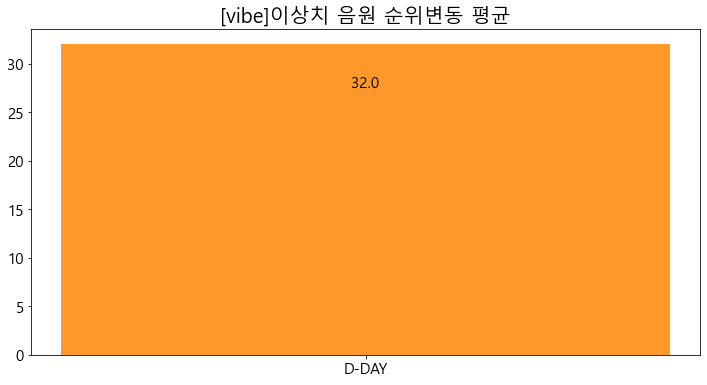

In [82]:
plt.figure(figsize=(12, 6))
colors = sns.color_palette('YlOrBr', outlier_df.shape[0])
plt.bar('곡', '순위변동평균(양수)', data=outlier_df, color=colors, width=0.5)
plt.title(f'[{site_name}]이상치 음원 순위변동 평균', fontdict={'size':20})
for i in range(outlier_df.shape[0]):
    plt.text(i, outlier_df['순위변동평균(양수)'][i] - outlier_df['순위변동평균(양수)'].max()*0.1, round(outlier_df['순위변동평균(양수)'][i], 1), verticalalignment='top', horizontalalignment='center', fontsize=15)
plt.xticks(fontsize=15, rotation=0)
plt.yticks(fontsize=15);

### 이상치 곡의 순위 그래프

In [83]:
outlier_df

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동,순위변동평균(양수)
0,2022-05-03,vibe,66.0,D-DAY,휘인(Whee In),D-DAY,THE L1VE,기타,32.0,32.0


In [84]:
path

'C:/data/Wantreez/Crawling/music/crawled_data/outlier_data/2022-05-02_2022-05-08/vibe/'

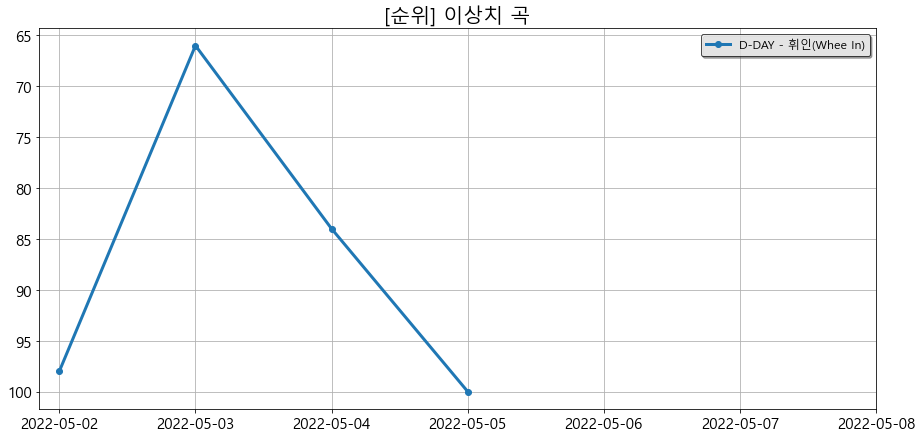

In [89]:
num = 5
for i in range( math.ceil(outlier_df.shape[0]/num) ):
    plt.figure(figsize=(15,7))
    ax = plt.axes()
    ax.invert_yaxis()
    plt.grid(True)
    for j in range( outlier_df.iloc[i*num:(i+1)*num, :].shape[0] ):
        temp = total_df[ (total_df['곡'] == outlier_df['곡'][j]) & (total_df['가수'] == outlier_df['가수'][j])].reset_index(drop=True)
        title = temp['곡'].value_counts().index[0]
        artist = temp['가수'].value_counts().index[0]
        song_label = title + ' - ' + artist
        plt.plot(temp['날짜'], temp['순위'], '-o', linewidth=3, label=song_label)
        plt.title('[순위] 이상치 곡', fontdict={'size':20})
    plt.xticks(temp['날짜'], fontsize=15)
    plt.yticks(fontsize=15)
    plt.legend(frameon=True, shadow=True, framealpha=0.7, fontsize=12, edgecolor='k')
    img_name = f'[{site_name}]{start_date}_{end_date}_[순위]이상치{i+1}.png'
    plt.savefig(path + img_name)

### 이상치 곡의 순위변동 그래프

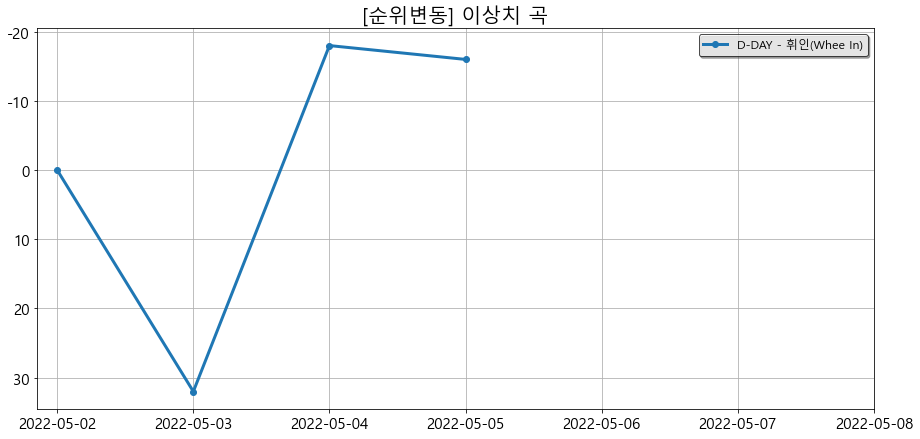

In [90]:
num = 5
for i in range( math.ceil(outlier_df.shape[0]/num) ):
    plt.figure(figsize=(15,7))
    ax = plt.axes()
    ax.invert_yaxis()
    plt.grid(True)
    for j in range( outlier_df.iloc[i*num:(i+1)*num, :].shape[0] ):
        temp = total_df[ (total_df['곡'] == outlier_df['곡'][j]) & (total_df['가수'] == outlier_df['가수'][j])].reset_index(drop=True)
        title = temp['곡'].value_counts().index[0]
        artist = temp['가수'].value_counts().index[0]
        song_label = title + ' - ' + artist
        plt.plot(temp['날짜'], temp['순위변동'], '-o', linewidth=3, label=song_label)
        plt.title('[순위변동] 이상치 곡', fontdict={'size':20})
    plt.xticks(temp['날짜'], fontsize=15)
    plt.yticks(fontsize=15)
    plt.legend(frameon=True, shadow=True, framealpha=0.7, fontsize=12, edgecolor='k')
    img_name = f'[{site_name}]{start_date}_{end_date}_[순위변동]이상치{i+1}.png'
    plt.savefig(path + img_name)

[flo]20220502_20220508_mean_outliers.xlsx 출력
[bugs]20220502_20220508_mean_outliers.xlsx 출력


C:\Users\kbjung\AppData\Local\Temp/ipykernel_15120/3580881751.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure( figsize=(15, 8) )


[genie]20220502_20220508_mean_outliers.xlsx 출력
[melon]20220502_20220508_mean_outliers.xlsx 출력
[vibe]20220502_20220508_mean_outliers.xlsx 출력


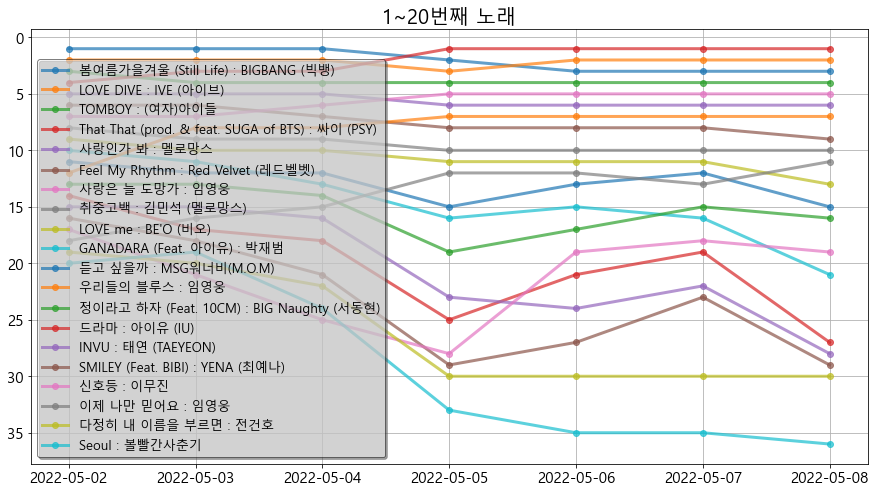

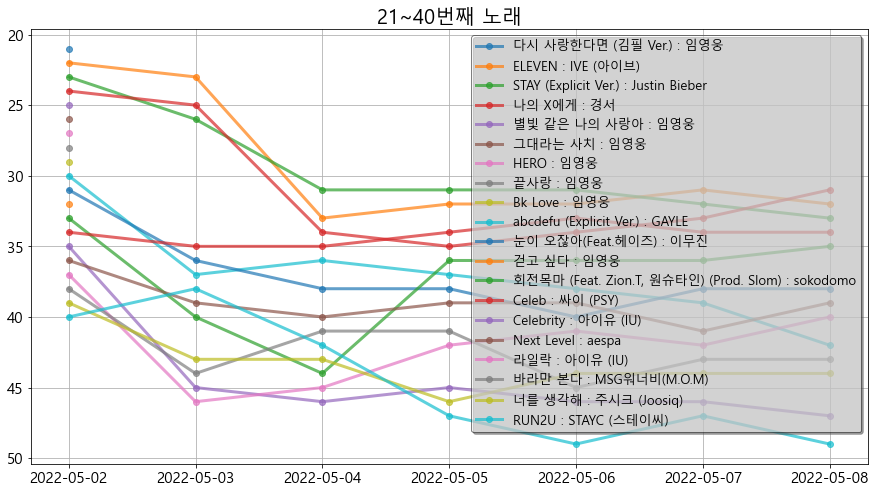

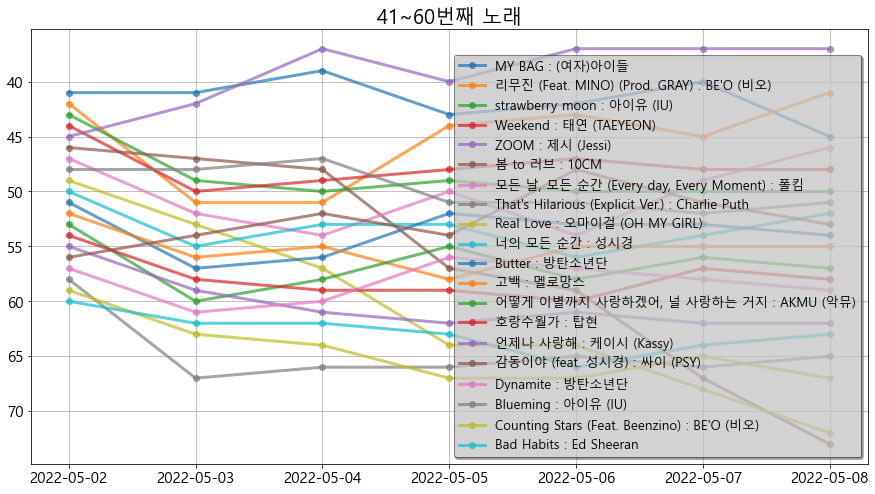

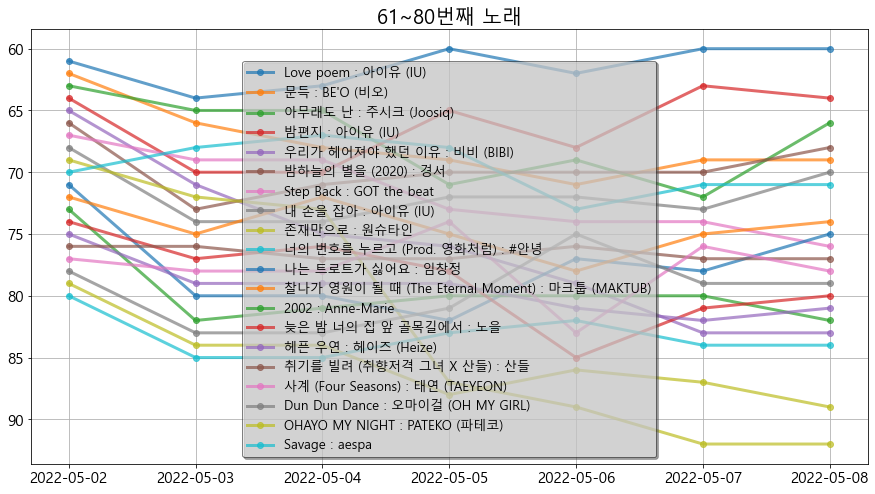

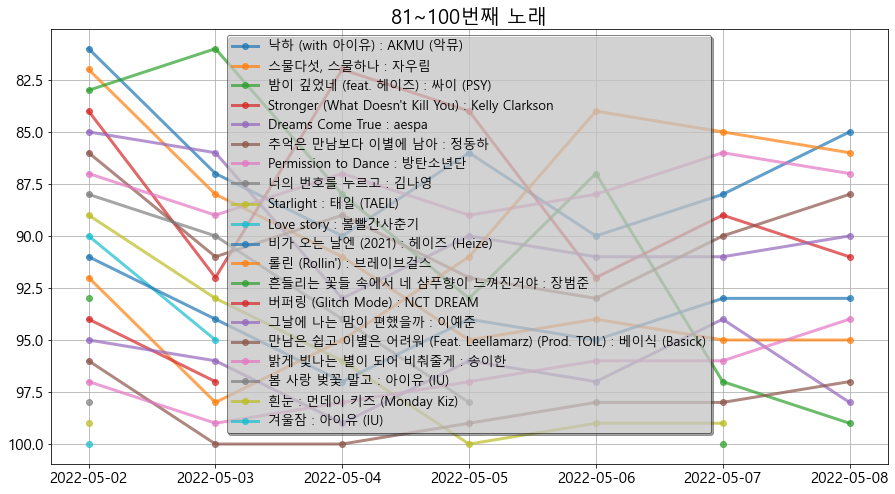

...

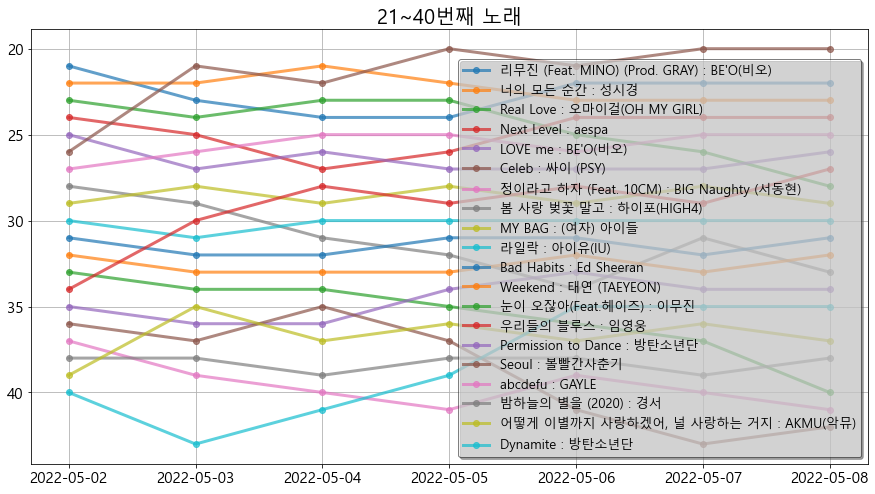

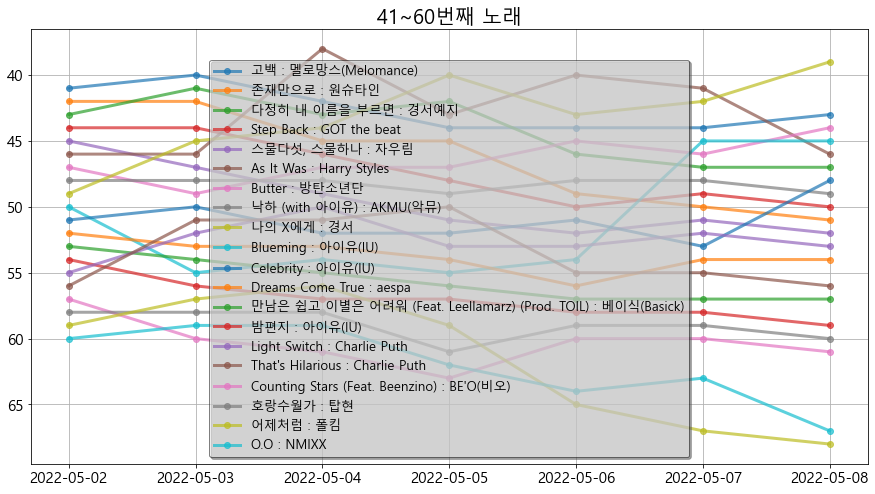

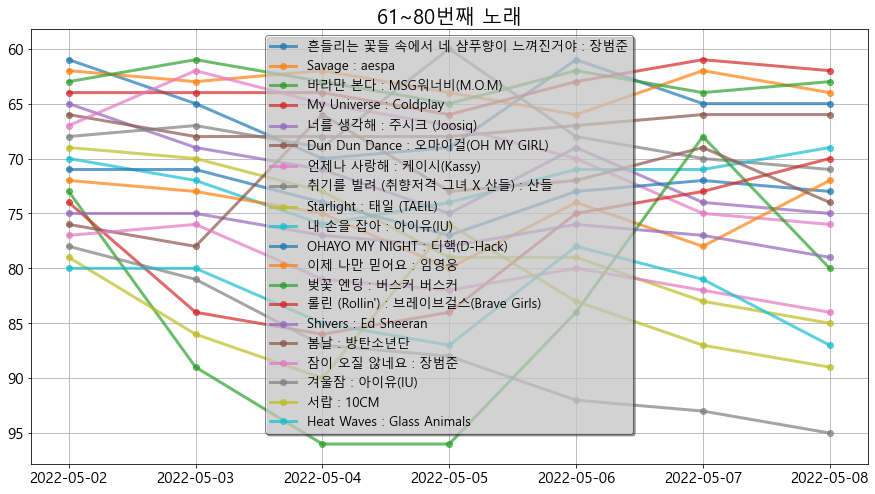

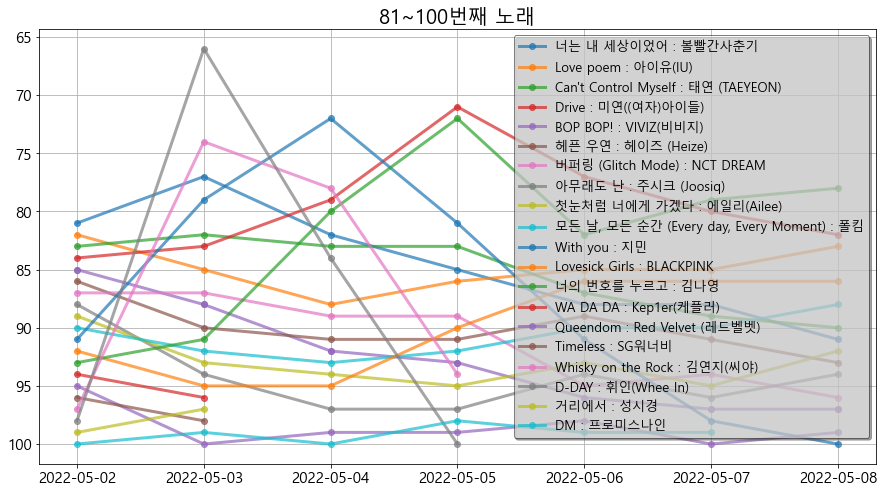

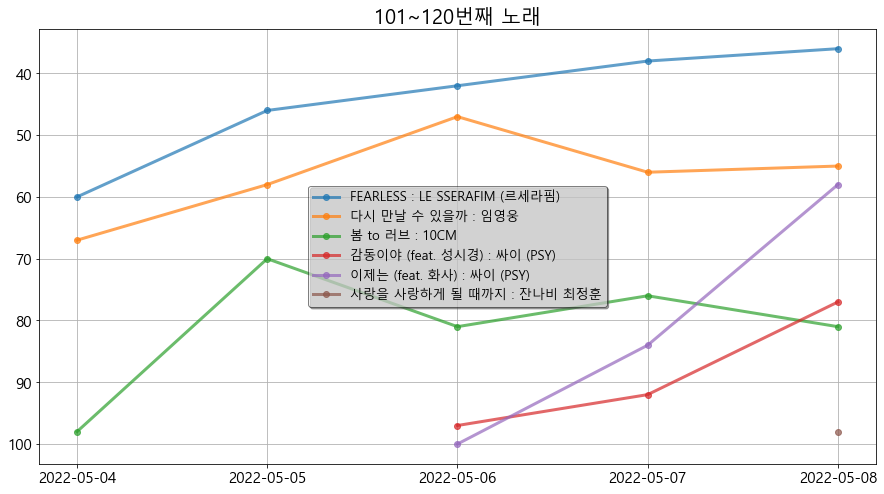

In [27]:
# 음원 사이트
site_list = ['flo', 'bugs', 'genie', 'melon', 'vibe']
total_outlier_df = pd.DataFrame()
for site_name in site_list:
    # 실시간 순위 파일 폴더로 이동
    live_folder = f'/crawled_data/mod_{site_name}/'
    try:
        os.chdir(code_path + live_folder)
    except:
        pass
    file_list = os.listdir()

    df = pd.DataFrame()
    for one in file_list:
        temp = pd.read_excel(one)
        df = pd.concat([df, temp], ignore_index=True)
    df['날짜'] = df['날짜'].astype(str)
    sliced_df = df[(df['날짜'] >= start_date) & (df['날짜'] <= end_date)].reset_index(drop=True)
    # 이번주 날짜 df
    dates = pd.date_range(start_date, end_date)
    basic_date_df = pd.DataFrame({'날짜':dates})
    basic_date_df['날짜'] = basic_date_df['날짜'].astype('str')
    # 음원의 유일한 곡, 가수 명 남기기
    unique_sliced_df = sliced_df.drop_duplicates(['곡', '가수']).reset_index(drop=True)
    # 음원별 순위변동 추가 df
    song_df_list = []
    for i in range(unique_sliced_df.shape[0]):
        temp = unique_sliced_df.iloc[i:i+1, :].reset_index(drop=True)
        one_df = sliced_df[(sliced_df['곡'] == temp['곡'][0]) & (sliced_df['가수'] == temp['가수'][0])].reset_index(drop=True)
        one_df['순위변동'] = - ( one_df['순위'] - one_df['순위'].shift(1) )
        one_df['순위변동'] = one_df['순위변동'].fillna(0)
        one_df['순위변동'] = one_df['순위변동'].astype('int64')
        merged_df = pd.merge(basic_date_df, one_df, how='left', on='날짜')
        site = merged_df['사이트'].value_counts().index[0]
        title = merged_df['곡'].value_counts().index[0]
        artist = merged_df['가수'].value_counts().index[0]
        album = merged_df['앨범'].value_counts().index[0]
        agency = merged_df['소속사'].value_counts().index[0]
        agency_type = merged_df['소속사_분류'].value_counts().index[0]
        merged_df['사이트'] = merged_df['사이트'].fillna(site)
        merged_df['곡'] = merged_df['곡'].fillna(title)
        merged_df['가수'] = merged_df['가수'].fillna(artist)
        merged_df['앨범'] = merged_df['앨범'].fillna(album)
        merged_df['소속사'] = merged_df['소속사'].fillna(agency)
        merged_df['소속사_분류'] = merged_df['소속사_분류'].fillna(agency_type)
        song_df_list.append(merged_df)
    # 그래프 저장할 폴더
    save_folder = f'/crawled_data/outlier_data/{start_date}_{end_date}/{site_name}/'
    # 그래프 출력
    number = 20
    t = 0
    for i in range( math.ceil(len(song_df_list)/number) ):
        plt.figure( figsize=(15, 8) )
        ax = plt.axes()
        ax.invert_yaxis()
        graph_df = song_df_list[i*number:(i+1)*number]
        for one in graph_df:
            title = one['곡'].value_counts().index.values[0]
            artist = one['가수'].value_counts().index.values[0]
            song_label = title + ' : ' + artist
            plt.plot(one['날짜'], one['순위'], '-o', label=song_label, linewidth=3, alpha=0.7)
        t =  t + number
        plt.grid(True)
        plt.title(f'{t-(number-1)}~{t}번째 노래', fontdict={'size':20})
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        plt.legend(framealpha=0.5, fontsize=13, frameon=True, edgecolor='k', shadow=True);
        plt.savefig(code_path + save_folder + f'{start_date}_{end_date}_그래프{t:0>2}.png')

    # 이번주 모든 노래 데이터 병합
    total_df = pd.DataFrame()
    for one in song_df_list:
        total_df = pd.concat([total_df, one], ignore_index=True)
    # 음원의 유일한 곡, 가수만 남기기
    unique_music_df = total_df.sort_values(['사이트', '곡', '가수', '순위']).reset_index(drop=True).drop_duplicates(['곡', '가수'], ignore_index=True)
    # 해당 음원의 순위변동이 양수인 df 추출
    mean_unique_music_df = pd.DataFrame()
    for i in range(unique_music_df.shape[0]):
        title = unique_music_df['곡'][i]
        artist = unique_music_df['가수'][i]
        temp = total_df[ (total_df['곡'] == title) & (total_df['가수'] == artist) & (total_df['순위변동'] > 0)].reset_index(drop=True)
        # 해당 음원의 순위변동평균
        temp['순위변동평균(양수)'] = round( temp['순위변동'].mean(), 1 )
        # 해당 음원 df의 첫째 줄만 추출
        first_temp = temp.iloc[0:1, :]
        mean_unique_music_df = pd.concat([mean_unique_music_df, first_temp], ignore_index=True)
    # 급등 음원 추출
    u_outlier = 30
    outlier_df = mean_unique_music_df[mean_unique_music_df['순위변동평균(양수)'] > u_outlier].reset_index(drop=True)
    # 파일 저장할 폴더 생성
    mod_start_date = start_date.replace('-','')
    mod_end_date = end_date.replace('-','')
    path = f'C:/data/Wantreez/Crawling/music/crawled_data/outlier_data/{start_date}_{end_date}/{site_name}/'
    os.makedirs(path, exist_ok=True)
    # 이상치 음원 평균 df 출력
    outlier_df.to_excel(path + f'[{site_name}]{mod_start_date}_{mod_end_date}_mean_outliers.xlsx', index=False)
    print(f'[{site_name}]{mod_start_date}_{mod_end_date}_mean_outliers.xlsx 출력')
    # 이상치 음원 df 종합
    total_outlier_df = pd.concat([total_outlier_df, outlier_df], ignore_index=True)

## 이상치 곡 종합

In [28]:
total_outlier_df

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동,순위변동평균(양수)
0,2022-05-08,bugs,36.0,LOVE,몬스타엑스(Monsta X),SHAPE of LOVE,스타쉽,스타쉽,59.0,59.0
1,2022-05-03,bugs,34.0,Light Switch,Charlie Puth(찰리 푸스),Light Switch,해외,기타,27.0,33.0
2,2022-05-04,bugs,38.0,꽃 길,BIGBANG (빅뱅),꽃 길,YG,YG,44.0,30.5
3,2022-05-05,bugs,66.0,나의 월요일,싸이 (PSY),싸다9,P NATION,기타,28.0,34.0
4,2022-05-05,bugs,42.0,리무진 (Feat. MINO) (Prod. GRAY),BE'O (비오),쇼미더머니 10 Episode 3,스윙,스윙,54.0,41.0
5,2022-05-05,bugs,62.0,문득,BE'O (비오),Bipolar,스윙,스윙,36.0,35.5
6,2022-05-05,bugs,56.0,사랑해 진짜,임영웅,IM HERO,물고기뮤직,기타,44.0,44.0
7,2022-05-05,bugs,52.0,아버지,임영웅,IM HERO,물고기뮤직,기타,43.0,40.0
8,2022-05-03,vibe,66.0,D-DAY,휘인(Whee In),D-DAY,THE L1VE,기타,32.0,32.0


In [49]:
idx = total_outlier_df[total_outlier_df['소속사'] == '해외'].index
idx

Int64Index([1], dtype='int64')

In [54]:
mod_total_outlier_df = total_outlier_df.drop(idx).reset_index(drop=True)
mod_total_outlier_df

,날짜,사이트,순위,곡,가수,앨범,소속사,소속사_분류,순위변동,순위변동평균(양수)
0,2022-05-08,bugs,36.0,LOVE,몬스타엑스(Monsta X),SHAPE of LOVE,스타쉽,스타쉽,59.0,59.0
1,2022-05-04,bugs,38.0,꽃 길,BIGBANG (빅뱅),꽃 길,YG,YG,44.0,30.5
2,2022-05-05,bugs,66.0,나의 월요일,싸이 (PSY),싸다9,P NATION,기타,28.0,34.0
3,2022-05-05,bugs,42.0,리무진 (Feat. MINO) (Prod. GRAY),BE'O (비오),쇼미더머니 10 Episode 3,스윙,스윙,54.0,41.0
4,2022-05-05,bugs,62.0,문득,BE'O (비오),Bipolar,스윙,스윙,36.0,35.5
5,2022-05-05,bugs,56.0,사랑해 진짜,임영웅,IM HERO,물고기뮤직,기타,44.0,44.0
6,2022-05-05,bugs,52.0,아버지,임영웅,IM HERO,물고기뮤직,기타,43.0,40.0
7,2022-05-03,vibe,66.0,D-DAY,휘인(Whee In),D-DAY,THE L1VE,기타,32.0,32.0


In [126]:
save_total_oulier_df_path = f'/crawled_data/outlier_data/{start_date}_{end_date}/'
code_path + save_total_oulier_df_path

'c:/data/Wantreez/Crawling/music/crawled_data/outlier_data/2022-05-02_2022-05-08/'

### 이상치 음원 df 출력

In [70]:
mod_total_outlier_df.to_excel(code_path + save_total_oulier_df_path + f'{start_date}_{end_date}_total_outlier.xlsx', index=False)
print(f'{start_date}_{end_date}_total_outlier.xlsx 출력')

2022-05-02_2022-05-08_total_outlier.xlsx 출력


### 이상치 음원 순위변동 평균 그래프(3-1-1. 순위 급상승 음원)

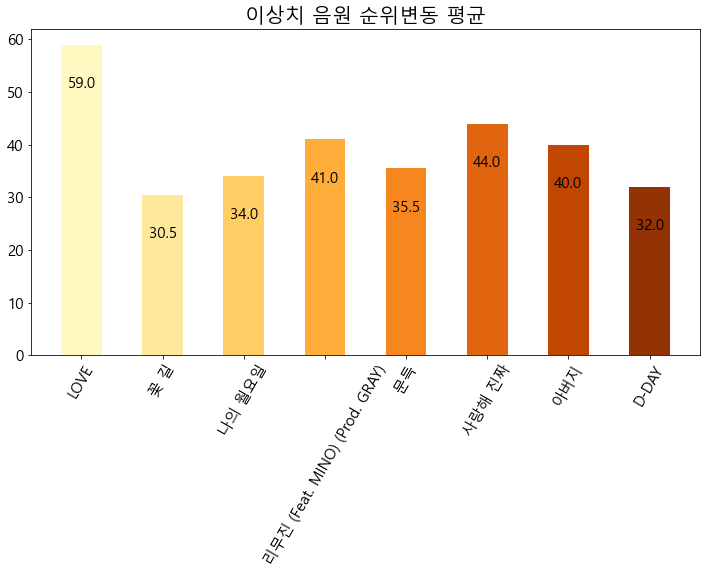

In [128]:
plt.figure(figsize=(12, 6))
colors = sns.color_palette('YlOrBr', mod_total_outlier_df.shape[0])
plt.bar('곡', '순위변동평균(양수)', data=mod_total_outlier_df, color=colors, width=0.5)
plt.title(f'이상치 음원 순위변동 평균', fontdict={'size':20})
for i in range(mod_total_outlier_df.shape[0]):
    plt.text(i, mod_total_outlier_df['순위변동평균(양수)'][i] - mod_total_outlier_df['순위변동평균(양수)'].max()*0.1, round(mod_total_outlier_df['순위변동평균(양수)'][i], 1), verticalalignment='top', horizontalalignment='center', fontsize=15)
plt.xticks(fontsize=15, rotation=60)
plt.yticks(fontsize=15);
plt.savefig(code_path + save_total_oulier_df_path + f'{start_date}_{end_date}_total_outlier.png')

### 이상치 음원들의 평균 순위(4-2-1. 소속사별 진입 음원)

In [109]:
# 음원 사이트
site_list = ['flo', 'bugs', 'genie', 'melon', 'vibe']
outlier_agency_df = pd.DataFrame()
for site_name in site_list:
    # 실시간 순위 파일 폴더로 이동
    live_folder = f'/crawled_data/mod_{site_name}/'
    try:
        os.chdir(code_path + live_folder)
    except:
        pass
    file_list = os.listdir()

    df = pd.DataFrame()
    for one in file_list:
        temp = pd.read_excel(one)
        df = pd.concat([df, temp], ignore_index=True)
    df['날짜'] = df['날짜'].astype(str)
    sliced_df = df[(df['날짜'] >= start_date) & (df['날짜'] <= end_date)].reset_index(drop=True)
 
    # 이상치 음원의 기획사 소속 가수 평균
    for agency in mod_total_outlier_df['소속사'].unique():
        temp = sliced_df[sliced_df['소속사'] == agency].reset_index(drop=True)
        outlier_agency_df = pd.concat([outlier_agency_df, temp], ignore_index=True)

In [110]:
outlier_agency_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 971 entries, 0 to 970
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   사이트     971 non-null    object
 1   날짜      971 non-null    object
 2   순위      971 non-null    int64 
 3   곡       971 non-null    object
 4   가수      971 non-null    object
 5   앨범      971 non-null    object
 6   소속사     971 non-null    object
 7   소속사_분류  971 non-null    object
dtypes: int64(1), object(7)
memory usage: 60.8+ KB


In [111]:
mean_outlier_agency_df = outlier_agency_df.groupby(['소속사', '사이트', '곡', '가수']).agg({'순위':'mean'}).reset_index()

In [112]:
mean_outlier_agency_df = mean_outlier_agency_df.rename(columns={'순위':'순위평균'})
mean_outlier_agency_df = mean_outlier_agency_df[['소속사', '곡', '가수', '순위평균', '사이트']]
mean_outlier_agency_df['순위평균'] = round(mean_outlier_agency_df['순위평균'], 1)

In [113]:
mean_outlier_agency_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   소속사     187 non-null    object 
 1   곡       187 non-null    object 
 2   가수      187 non-null    object 
 3   순위평균    187 non-null    float64
 4   사이트     187 non-null    object 
dtypes: float64(1), object(4)
memory usage: 7.4+ KB


In [114]:
mean_outlier_agency_df.head()

,소속사,곡,가수,순위평균,사이트
0,P NATION,9INTRO,싸이 (PSY),44.2,bugs
1,P NATION,Celeb,싸이 (PSY),8.4,bugs
2,P NATION,Everyday,싸이 (PSY),39.0,bugs
3,P NATION,GANJI (feat. Jessi),싸이 (PSY),53.0,bugs
4,P NATION,Happier (feat. Crush),싸이 (PSY),46.2,bugs


In [115]:
# 이상치 음원 소속사 음원 순위 평균 df 출력
mean_outlier_agency_df.to_excel(code_path + save_total_oulier_df_path + f'{start_date}_{end_date}_mean_outlier_agency.xlsx', index=False)
print(f'{start_date}_{end_date}_mean_outlier_agency.xlsx 출력')

2022-05-02_2022-05-08_mean_outlier_agency.xlsx 출력


### 이상치 음원 기획사별 분석(4-1-1. 기획사별 음원차트 진입 요약)

In [116]:
agency_music_df = mean_outlier_agency_df.drop_duplicates(['소속사', '곡', '가수']).reset_index(drop=True)
agency_music_df

,소속사,곡,가수,순위평균,사이트
0,P NATION,9INTRO,싸이 (PSY),44.2,bugs
1,P NATION,Celeb,싸이 (PSY),8.4,bugs
2,P NATION,Everyday,싸이 (PSY),39.0,bugs
3,P NATION,GANJI (feat. Jessi),싸이 (PSY),53.0,bugs
4,P NATION,Happier (feat. Crush),싸이 (PSY),46.2,bugs
...,...,...,...,...,...
78,스타쉽,LOVE,몬스타엑스(Monsta X),66.3,bugs
79,스타쉽,LOVE DIVE,IVE (아이브),3.0,bugs
80,스타쉽,LOVE,몬스타엑스,74.1,genie
81,스타쉽,ELEVEN,IVE(아이브),11.6,vibe


In [118]:
agency_music_df.groupby(['소속사']).agg('size').reset_index()

,소속사,0
0,P NATION,27
1,THE L1VE,3
2,YG,14
3,물고기뮤직,21
4,스윙,11
5,스타쉽,7


In [119]:
mean_outlier_agency_df.groupby(['소속사']).agg('size').reset_index()

,소속사,0
0,P NATION,44
1,THE L1VE,3
2,YG,22
3,물고기뮤직,82
4,스윙,22
5,스타쉽,14


In [120]:
num_music = mean_outlier_agency_df.groupby(['소속사']).agg('size').reset_index().sort_values(0, ascending=False)
num_music.columns = ['소속사', '음원수량']
num_music

,소속사,음원수량
3,물고기뮤직,82
0,P NATION,44
2,YG,22
4,스윙,22
5,스타쉽,14
1,THE L1VE,3


In [121]:
num_music_df = pd.merge(mean_outlier_agency_df, num_music, how='left', on='소속사')
num_music_df.head()

,소속사,곡,가수,순위평균,사이트,음원수량
0,P NATION,9INTRO,싸이 (PSY),44.2,bugs,44
1,P NATION,Celeb,싸이 (PSY),8.4,bugs,44
2,P NATION,Everyday,싸이 (PSY),39.0,bugs,44
3,P NATION,GANJI (feat. Jessi),싸이 (PSY),53.0,bugs,44
4,P NATION,Happier (feat. Crush),싸이 (PSY),46.2,bugs,44


In [122]:
max_num_music = num_music_df.sort_values(['음원수량', '순위평균'], ascending=False).iloc[0:1, :]
max_num_music

,소속사,곡,가수,순위평균,사이트,음원수량
72,물고기뮤직,별빛 같은 나의 사랑아,임영웅,90.0,bugs,82


In [123]:
max_rank_music = num_music_df.sort_values('순위평균', ascending=True).iloc[0:1, :]
max_rank_music

,소속사,곡,가수,순위평균,사이트,음원수량
186,스타쉽,LOVE DIVE,IVE(아이브),1.0,vibe,14


In [124]:
agency_in_chart = pd.concat([max_num_music, max_rank_music], ignore_index=True)
agency_in_chart

,소속사,곡,가수,순위평균,사이트,음원수량
0,물고기뮤직,별빛 같은 나의 사랑아,임영웅,90.0,bugs,82
1,스타쉽,LOVE DIVE,IVE(아이브),1.0,vibe,14


In [125]:
# 이상치 음원 소속사별 음원차트 진입 요약 df 출력
agency_in_chart.to_excel(code_path + save_total_oulier_df_path + f'{start_date}_{end_date}_agency_in_chart.xlsx', index=False)
print(f'{start_date}_{end_date}_agency_in_chart.xlsx 출력')

2022-05-02_2022-05-08_agency_in_chart.xlsx 출력


# 코드 마지막